In [ ]:
#ResNet and GRU

# Team Number 3

In [80]:
import os   # handling the files
import pickle # storing numpy features
import numpy as np
from tqdm.notebook import tqdm # how much data is process till now
from tensorflow.keras.applications.vgg16 import VGG16 , preprocess_input # extract features from image data.
from tensorflow.keras.preprocessing.image import load_img , img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.layers import Input , Dense , Embedding , Dropout , add, BatchNormalization,Bidirectional,GRU,Concatenate
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import random
from tensorflow.keras.utils import plot_model
from textwrap import wrap


In [3]:
BASE_DIR = '/Users/chaitanya/anaconda3/DSME_Final_Project'
WORKING_DIR = '/Users/chaitanya/anaconda3/DSME_Final_Project'

In [4]:
# Load ResNet Model
model = ResNet50()

# restructure model
model = Model(inputs = model.inputs , outputs = model.layers[-2].output)

# Summerize
print(model.summary())

2023-04-25 15:00:43.704962: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

# extract features from image
features = {}
directory = os.path.join(BASE_DIR, 'Images')

for img_name in tqdm(os.listdir(directory)):
    # load the image from file
    img_path = directory + '/' + img_name
    image = load_img(img_path, target_size=(224, 224))
    # convert image pixels to numpy array
    image = img_to_array(image)
    # reshape data for model
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    # preprocess image for vgg
    image = preprocess_input(image)
    # extract features
    feature = model.predict(image, verbose=0)
    # get image ID
    image_id = img_name.split('.')[0]
    # store feature
    features[image_id] = feature

In [5]:
import os
import glob
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
from tqdm import tqdm

# extract features from image
features = {}
directory = os.path.join(BASE_DIR, 'Images')

for img_path in tqdm(glob.glob(os.path.join(directory, '*.jpg'))):
    # load the image from file
    image = load_img(img_path, target_size=(224, 224))
    # convert image pixels to numpy array
    image = img_to_array(image)
    # reshape data for model
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    # preprocess image for ResNet
    image = preprocess_input(image)
    # extract features
    feature = model.predict(image, verbose=0)
    # get image ID
    image_id = os.path.splitext(os.path.basename(img_path))[0]
    # store feature
    features[image_id] = feature


100%|██████████| 8091/8091 [57:48<00:00,  2.33it/s]  


In [7]:
# store features in pickle
pickle.dump(features, open(os.path.join(WORKING_DIR, 'features_resnet.pkl'), 'wb'))

In [5]:
# load features from pickle
with open(os.path.join(WORKING_DIR, 'features_resnet.pkl'), 'rb') as f:
    features = pickle.load(f)

In [6]:
with open(os.path.join(BASE_DIR, 'captions.txt'), 'r') as f:
    next(f)
    captions_doc = f.read()

In [7]:
# create mapping of image to captions
mapping = {}
# process lines
for line in tqdm(captions_doc.split('\n')):
    # split the line by comma(,)
    tokens = line.split(',')
    if len(line) < 2:
        continue
    image_id, caption = tokens[0], tokens[1:]
    # remove extension from image ID
    image_id = image_id.split('.')[0]
    # convert caption list to string
    caption = " ".join(caption)
    # create list if needed
    if image_id not in mapping:
        mapping[image_id] = []
    # store the caption
    mapping[image_id].append(caption)

  0%|          | 0/40456 [00:00<?, ?it/s]

In [8]:
len(mapping)

8091

In [14]:
def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
            # take one caption at a time
            caption = captions[i]
            # preprocessing steps
            # convert to lowercase
            caption = caption.lower()
            # delete digits, special chars, etc., 
            caption = caption.replace('[^A-Za-z]', '')
            # delete additional spaces
            caption = caption.replace('\s+', ' ')
            # add start and end tags to the caption
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word)>1]) + ' endseq'
            captions[i] = caption

In [15]:
# before preprocess of text
mapping['1000268201_693b08cb0e']

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

In [16]:
# preprocess the text
clean(mapping)

In [17]:
# after preprocess of text
mapping['1000268201_693b08cb0e']

['startseq startseq child in pink dress is climbing up set of stairs in an entry way endseq endseq',
 'startseq startseq girl going into wooden building endseq endseq',
 'startseq startseq little girl climbing into wooden playhouse endseq endseq',
 'startseq startseq little girl climbing the stairs to her playhouse endseq endseq',
 'startseq startseq little girl in pink dress going into wooden cabin endseq endseq']

In [18]:
all_captions = []
for key in mapping:
    for caption in mapping[key]:
        all_captions.append(caption)

In [19]:
len(all_captions)

40455

In [20]:
all_captions[:10]

['startseq startseq child in pink dress is climbing up set of stairs in an entry way endseq endseq',
 'startseq startseq girl going into wooden building endseq endseq',
 'startseq startseq little girl climbing into wooden playhouse endseq endseq',
 'startseq startseq little girl climbing the stairs to her playhouse endseq endseq',
 'startseq startseq little girl in pink dress going into wooden cabin endseq endseq',
 'startseq startseq black dog and spotted dog are fighting endseq endseq',
 'startseq startseq black dog and tri-colored dog playing with each other on the road endseq endseq',
 'startseq startseq black dog and white dog with brown spots are staring at each other in the street endseq endseq',
 'startseq startseq two dogs of different breeds looking at each other on the road endseq endseq',
 'startseq startseq two dogs on pavement moving toward each other endseq endseq']

In [21]:
# tokenize the text
tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)
vocab_size = len(tokenizer.word_index) + 1

In [22]:
vocab_size

8485

In [23]:
# get maximum length of the caption available
max_length = max(len(caption.split()) for caption in all_captions)
max_length

37

In [24]:
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90)
train = image_ids[:split]
test = image_ids[split:]

In [25]:
# create data generator to get data in batch (avoids session crash)
def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
    # loop over images
    X1, X2, y = list(), list(), list()
    n = 0
    while 1:
        for key in data_keys:
            n += 1
            captions = mapping[key]
            # process each caption
            for caption in captions:
                # encode the sequence
                seq = tokenizer.texts_to_sequences([caption])[0]
                # split the sequence into X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pairs
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq],num_classes=vocab_size)[0]
                    # store the sequences
                    X1.append(features[key][0])
                    X2.append(in_seq)
                    y.append(out_seq)
            if n == batch_size:
                X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                yield [X1, X2], y
                X1, X2, y = list(), list(), list()
                n = 0

# Test

from keras.layers import Concatenate, Bidirectional, GRU, Embedding, Input, Dense, Dropout

# Image feature extraction
inputs1 = Input(shape=(4096,))
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
dr2 = Dropout(0.4)(fe2)
fe3 = Dense(256, activation='relu')(dr2)
fe4 = Dense(128, activation='relu')(fe3)
dr4 = Dropout(0.4)(fe4)

# Sequence feature extraction
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)
se2 = Dropout(0.4)(se1)
se3 = Bidirectional(GRU(256))(se2)
se4 = Embedding(vocab_size, 128, mask_zero=True)(inputs2)
se5 = Dropout(0.4)(se4)
se6 = Bidirectional(GRU(256))(se5)

# Merging the features from image and sequence
decoder1 = Concatenate()([dr4, se6])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

# Compiling the model
model = Model(inputs=[inputs1, inputs2], outputs=outputs)


In [53]:
# Encoder model
# Image feature layers
inputs1 = Input(shape=(4096,))
fe1 = Dropout(0.3)(inputs1)  # Adjusted dropout rate
fe2 = Dense(256, activation='relu')(fe1)  # Increased hidden layer size
fe2 = BatchNormalization()(fe2)
fe3 = Dense(256, activation='relu')(fe2)  # Increased hidden layer size
fe3 = BatchNormalization()(fe3)

# Sequence feature layers
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)  # Increased embedding vector size
se2 = Dropout(0.3)(se1)  # Adjusted dropout rate
se3 = Bidirectional(GRU(256))(se2)  # Increased hidden layer size

# Decoder model
decoder1 = Concatenate()([fe3, se3])
decoder2 = Dense(128, activation='relu')(decoder1)  # Increased hidden layer size
decoder2 = BatchNormalization()(decoder2)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

# Create the model
model = Model(inputs=[inputs1, inputs2], outputs=outputs)

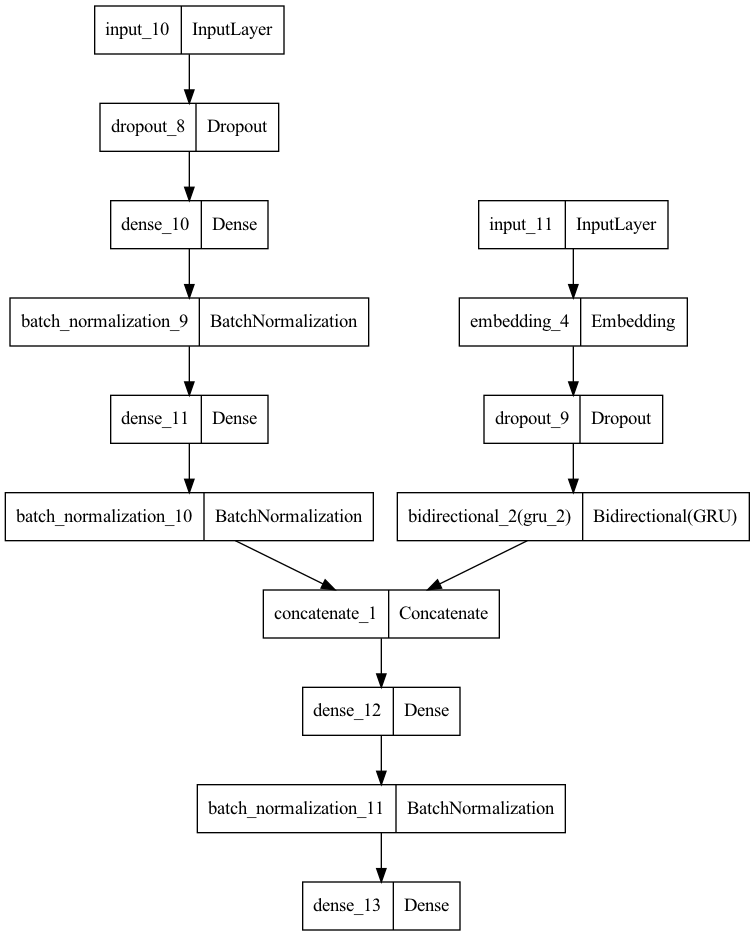

In [81]:
plot_model(model)

In [83]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 4096)]       0           []                               
                                                                                                  
 dropout_8 (Dropout)            (None, 4096)         0           ['input_10[0][0]']               
                                                                                                  
 dense_10 (Dense)               (None, 256)          1048832     ['dropout_8[0][0]']              
                                                                                                  
 input_11 (InputLayer)          [(None, 37)]         0           []                               
                                                                                            

import matplotlib.pyplot as plt

# compile the model
model.compile(optimizer='adam', loss='binary_crossentropy')

# create list to store the loss values for each epoch
loss_values = []

# train the model
epochs = 40
batch_size = 32
steps = len(train) // batch_size

for i in range(epochs):
    # create data generator
    generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
    # fit for one epoch
    history = model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    loss_values.append(history.history['loss'])

# plot the loss values over time
plt.plot(loss_values)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

In [54]:
import matplotlib.pyplot as plt

# compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy')

# create list to store the loss values for each epoch
loss_values = []

# train the model
epochs = 50
batch_size = 32
steps = len(train) // batch_size

model_name = "model_gru.h5"

# Define early stopping
early_stopping = EarlyStopping(monitor='val_loss',min_delta = 0, patience = 5, verbose = 1, restore_best_weights=True)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.2, 
                                            min_lr=0.00000001)

checkpoint = ModelCheckpoint(model_name,
                            monitor="val_loss",
                            mode="min",
                            save_best_only = True,
                            verbose=1)
for i in range(epochs):
    # create data generator
    generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
    # fit for one epoch
    history = model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1, callbacks=[checkpoint,early_stopping,learning_rate_reduction])
    loss_values.append(history.history['loss'])
    
    # Check if early stopping condition is met
    if early_stopping.stopped_epoch is not None and early_stopping.stopped_epoch + 1 == i:
        print('Early stopping condition is met. Stopped at epoch:', i)
        break



227/227 [==============================] - 928s 4s/step - loss: 3.4672 - lr: 0.0010
Early stopping condition is met. Stopped at epoch: 1


In [49]:
train

['1000268201_693b08cb0e',
 '1001773457_577c3a7d70',
 '1002674143_1b742ab4b8',
 '1003163366_44323f5815',
 '1007129816_e794419615',
 '1007320043_627395c3d8',
 '1009434119_febe49276a',
 '1012212859_01547e3f17',
 '1015118661_980735411b',
 '1015584366_dfcec3c85a',
 '101654506_8eb26cfb60',
 '101669240_b2d3e7f17b',
 '1016887272_03199f49c4',
 '1019077836_6fc9b15408',
 '1019604187_d087bf9a5f',
 '1020651753_06077ec457',
 '1022454332_6af2c1449a',
 '1022454428_b6b660a67b',
 '1022975728_75515238d8',
 '102351840_323e3de834',
 '1024138940_f1fefbdce1',
 '102455176_5f8ead62d5',
 '1026685415_0431cbf574',
 '1028205764_7e8df9a2ea',
 '1030985833_b0902ea560',
 '103106960_e8a41d64f8',
 '103195344_5d2dc613a3',
 '103205630_682ca7285b',
 '1032122270_ea6f0beedb',
 '1032460886_4a598ed535',
 '1034276567_49bb87c51c',
 '104136873_5b5d41be75',
 '1042020065_fb3d3ba5ba',
 '1042590306_95dea0916c',
 '1045521051_108ebc19be',
 '1048710776_bb5b0a5c7c',
 '1052358063_eae6744153',
 '105342180_4d4a40b47f',
 '1053804096_ad278b25

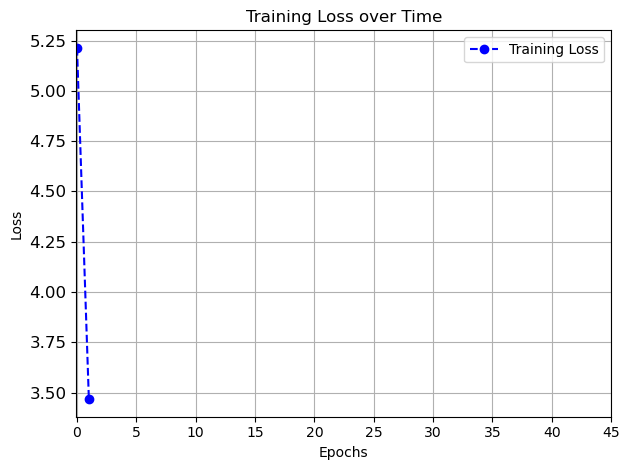

In [55]:
# plot the loss values over time
plt.plot(loss_values, linestyle='--', marker='o', color='blue', label='Training Loss')
plt.title('Training Loss over Time')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.xticks(range(0, epochs, 5))
plt.yticks(fontsize=12)
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

In [56]:
# save the model
model.save(WORKING_DIR+'/gru_model.h5')

In [57]:
def idx_to_word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

In [58]:
# generate caption for an image
def predict_caption(model, image, tokenizer, max_length):
    # add start tag for generation process
    in_text = 'startseq'
    # iterate over the max length of sequence
    for i in range(max_length):
        # encode input sequence
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict next word
        yhat = model.predict([image, sequence], verbose=0)
        # get index with high probability
        yhat = np.argmax(yhat)
        # convert index to word
        word = idx_to_word(yhat, tokenizer)
        # stop if word not found
        if word is None:
            break
        # append word as input for generating next word
        in_text += " " + word
        # stop if we reach end tag
        if word == 'endseq':
            break
    return in_text

In [164]:
from nltk.translate.bleu_score import corpus_bleu
# validate with test data
actual, predicted = list(), list()

for key in tqdm(test):
    # get actual caption
    captions = mapping[key]
    # predict the caption for image
    y_pred = predict_caption(model, features[key], tokenizer, max_length)
    # split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # append to the list
    actual.append(actual_captions)
    predicted.append(y_pred)
# calcuate BLEU score
print("Mean BLEU Score: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))


  0%|          | 0/810 [00:00<?, ?it/s]

Mean BLEU Score: 0.600842


In [71]:
print("Mean BLEU Score: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))


Mean BLEU Score: 0.600842


In [184]:
from PIL import Image
import nltk
import matplotlib.pyplot as plt
def generate_caption(image_name):
    under_cap = []
    # load the image
    # image_name = "1001773457_577c3a7d70.jpg"
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    #print('---------------------Actual---------------------')
    for caption in captions:
        under_cap.append(caption)
    true_captions = [under_cap]
    #print(true_captions)
    # predict the caption
    y_pred = predict_caption(model, features[image_id], tokenizer, max_length)
    #print('--------------------Predicted--------------------')
    #print(y_pred)
    gen_captions = [y_pred]
    #print(gen_captions)
    
   # Display the images and predicted caption in a single row with captions on top
    fig = plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title(y_pred)
    plt.axis("off")
    plt.subplots_adjust(hspace=0.7, wspace=0.3)
    plt.show()
    
    #print('--------------------F-SCORE--------------------')
    gen_captions_tok = [nltk.word_tokenize(caption.lower()) for caption in gen_captions]
    true_captions_tok = [[nltk.word_tokenize(caption.lower()) for caption in captions] for captions in true_captions]
    # compute the BLEU score using 4-gram matches
    bleu_score = nltk.translate.bleu_score.corpus_bleu(true_captions_tok, gen_captions_tok, weights=(1, 0, 0, 0))
    # compute precision and recall
    precision = bleu_score
    recall = bleu_score / len(gen_captions)
    # compute F-score
    fscore = 2 * ((precision * recall) / (precision + recall))
    #print(fscore)

Generated Caption:    man is sitting on the water 


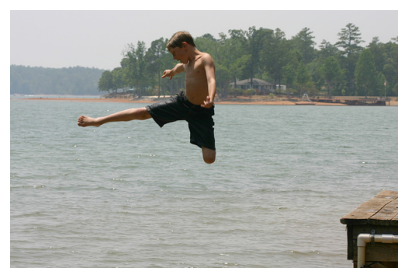

Generated Caption:    man wearing woman sitting on street street 


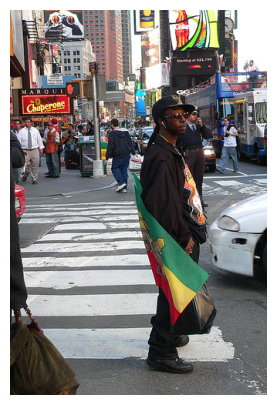

Generated Caption:    man is sitting on bench of building 


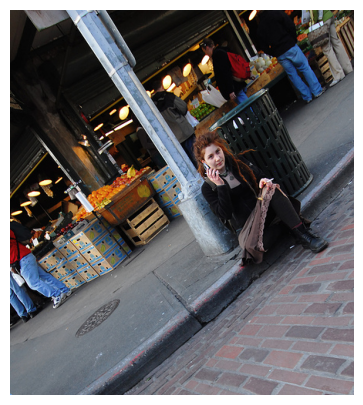

Generated Caption:    man is jumping off ramp 


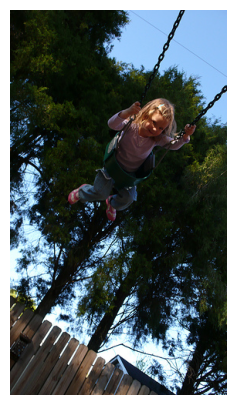

Generated Caption:    little boy in red shirt is playing in the grass 


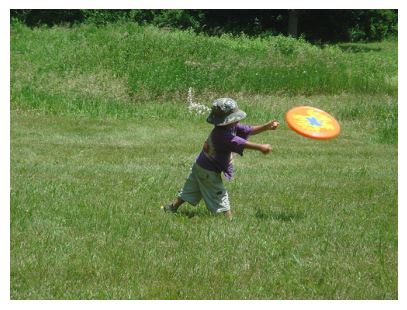

Generated Caption:    black dog is running in the grass 


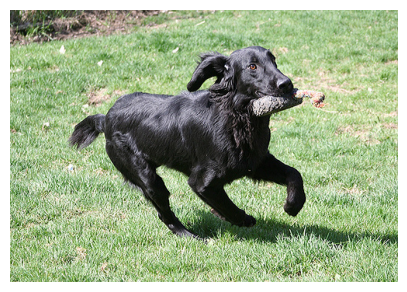

Generated Caption:    two people are walking on the beach 


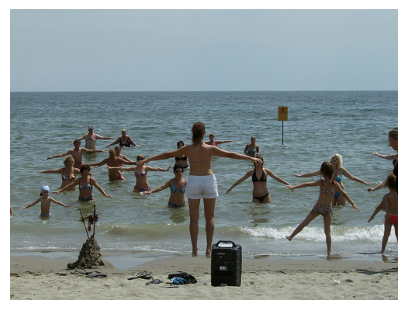

Generated Caption:    girl is playing in the water 


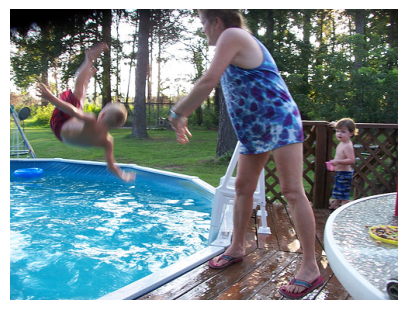

Generated Caption:    woman is sitting on the street 


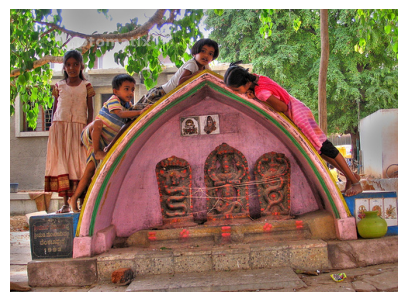

Generated Caption:    brown dog is walking on the snow 


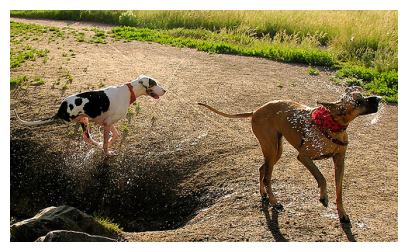

Generated Caption:    dog is running through the grass 


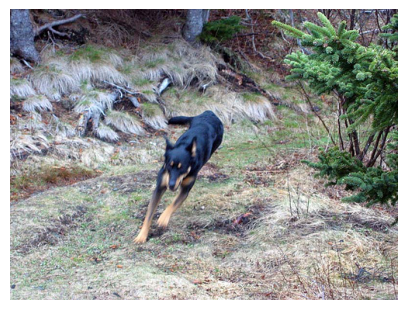

Generated Caption:    woman wearing pink shirt is sitting on her head 


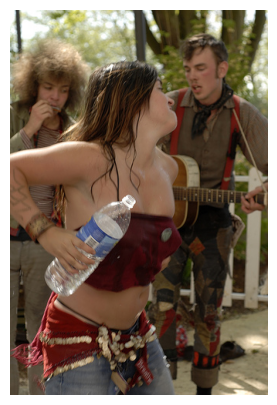

Generated Caption:    little girl wearing pink shirt is swinging swing 


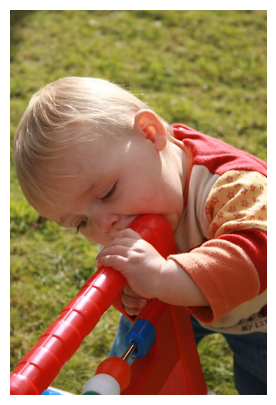

Generated Caption:    man in black shirt is sitting on the water 


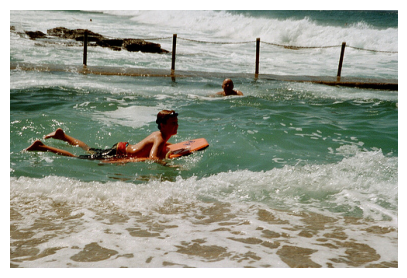

Generated Caption:    man is sitting in the water 


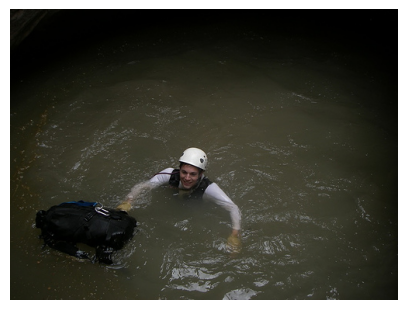

In [107]:
for image_id in random_image_ids:
    # Get the image features using the image ID (assuming 'features' is a dictionary mapping image IDs to features)
    img_features_test = features[image_id]  # replace 'features' with your dictionary of image IDs and features
    
    # Generate the caption for the current image
    predicted_caption = predict_caption(model, img_features_test, tokenizer, max_length)
    predicted_caption = predicted_caption.replace('startseq', '').replace('endseq', '')

    # Display the images and predicted caption in a single row with captions on top
    
    print("Generated Caption: ", predicted_caption)
    img_path = os.path.join(BASE_DIR, "Images", image_id) + ".jpg"
    image = Image.open(img_path)
    image = img_to_array(image)
    image = image/255.
    fig = plt.figure(figsize=(5, 5))
    plt.imshow(image)
    plt.axis("off")
    plt.subplots_adjust(hspace=0.7, wspace=0.3)
    plt.show()

In [112]:
import pandas as pd
samples = pd.DataFrame(test)
rand_samples = samples.sample(15)

In [160]:
def readImage(path,img_size=224):
    image = load_img(path,color_mode='rgb',target_size=(img_size,img_size))
    image = Image.open(img_path)
    image = img_to_array(image)
    image = image/255.
    
    return image


def display_images(temp_df):
    temp_df = samples.reset_index(drop=True)
    plt.figure(figsize=(20, 20))
    n = 0
    for i in range(min(25, len(temp_df))):
        n += 1
        # Get the image ID from the DataFrame
        image_id = temp_df[0].iloc[i]
        
        # Get the image features using the image ID (assuming 'features' is a dictionary mapping image IDs to features)
        img_features_test = features[image_id]  # replace 'features' with your dictionary of image IDs and features

        # Generate the caption for the current image
        predicted_caption = predict_caption(model, img_features_test, tokenizer, max_length)
        predicted_caption = predicted_caption.replace('startseq', '').replace('endseq', '')

        # Display the images and predicted caption in a single row with captions on top
        plt.subplot(5, 5, n)
        plt.subplots_adjust(hspace=0.7, wspace=0.3)
        img_path = f"/Users/chaitanya/anaconda3/DSME_Final_Project/Images/{str(image_id)}.jpg"
        image = Image.open(img_path)
        plt.imshow(image)
        plt.title("\n".join(wrap(predicted_caption, 20)))
        plt.axis("off")

   

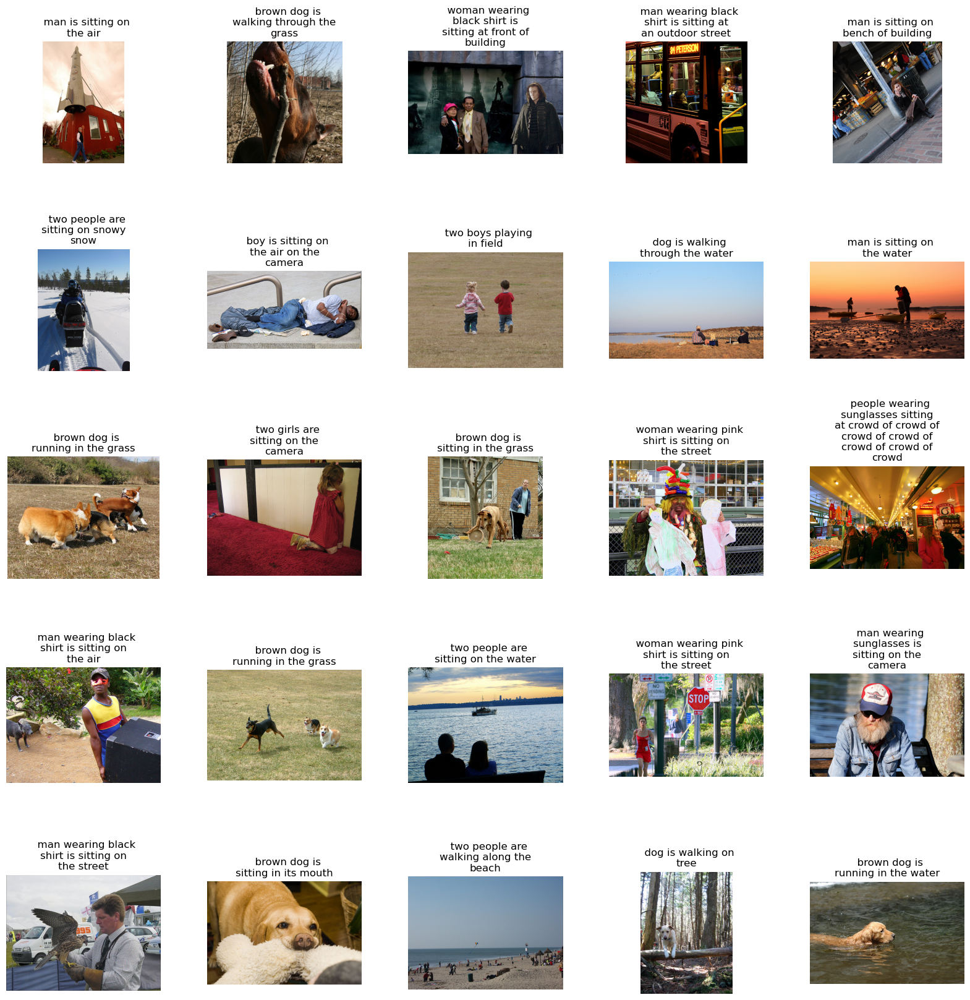

In [161]:
display_images(rand_samples)

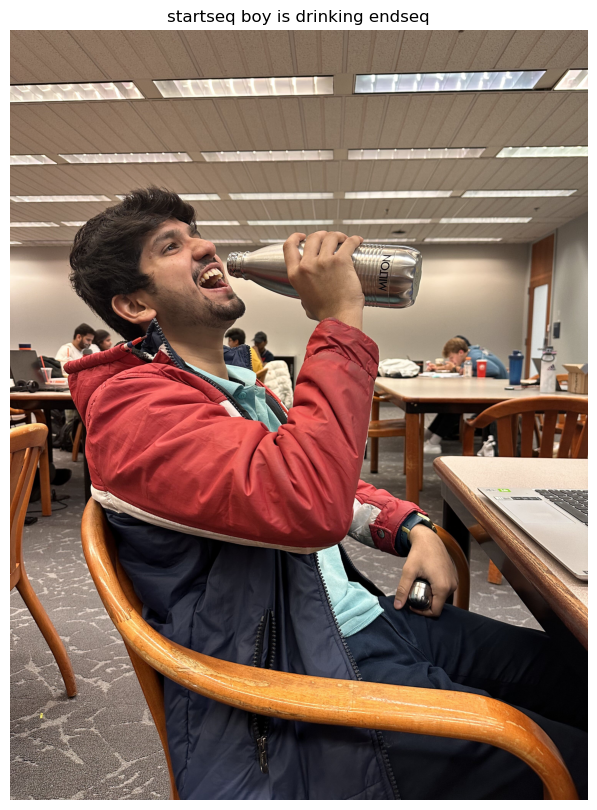

In [183]:
generate_caption("2098418613_85a0c9afea.jpg")

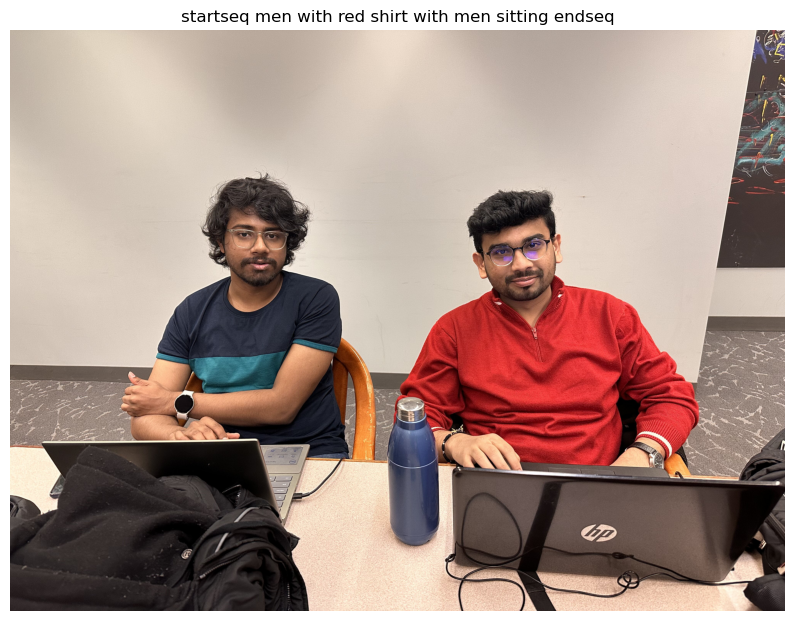

/Users/chaitanya/anaconda3/lib/python3.10/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


In [185]:
generate_caption("2098174172_e57d86ea03.jpg")